# Area and density based count estimation

In [1]:

import skimage

import matplotlib.pyplot as plt

import sys

sys.path += [".."]  # NOTE find shared modules
from util.preprocess import *
from util.plot import *

import itertools as it
from scipy.ndimage import generic_filter


def norm(x):
  return (x - x.min()) / (x.max() - x.min())

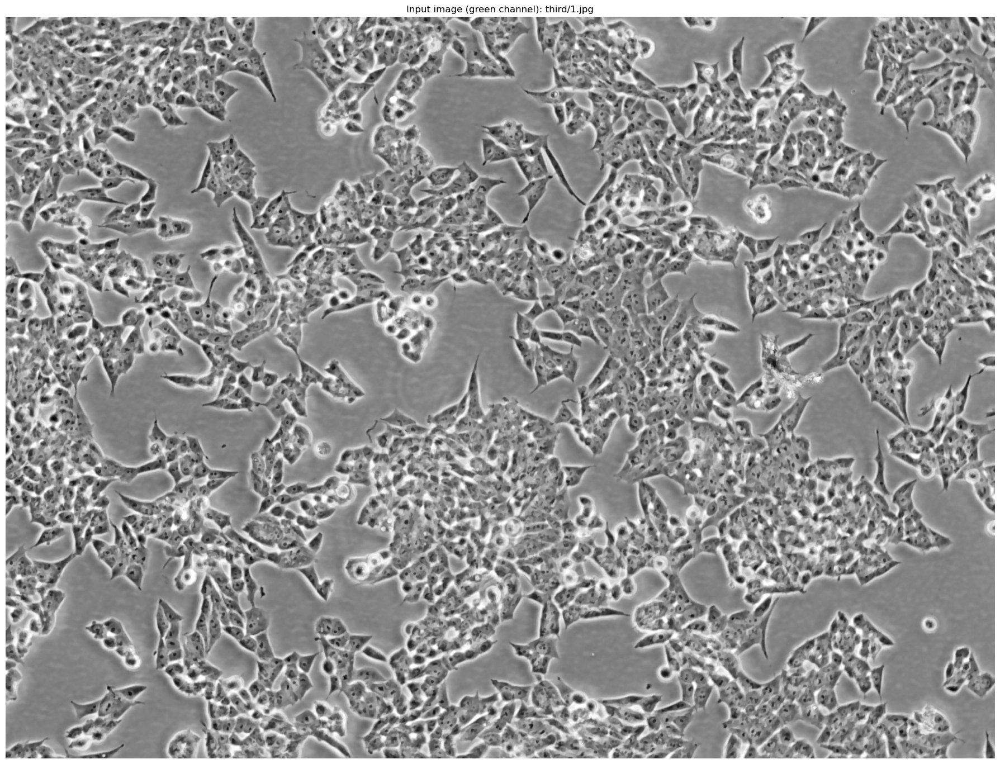

In [2]:

img_path = "third/1.jpg"
img = skimage.io.imread(f"../data/{img_path}")
img = img.astype(np.float32) / 255

# green channel turned out to be the sharpest
G = img[:, :, 1]

pos = preprocess_point("../data/third/points.json")


plot_image(G, title=f"Input image (green channel): {img_path}");

2023-11-25 16:14:57.589701382 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 75007, index: 5, mask: {6, 38, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.


2023-11-25 16:14:57.589594172 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 75005, index: 3, mask: {4, 36, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2023-11-25 16:14:57.590048117 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 75008, index: 6, mask: {7, 39, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2023-11-25 16:14:57.589705456 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 75006, index: 4, mask: {5, 37, }, error code: 22 error msg: Invalid argument. Specify the number of threads explicitly so the affinity is not set.
2023-11-25 16:14:57.589589064 [E:onnxruntime:Default, env.cc:254 ThreadMain] pthread_setaffinity_np failed for thread: 75004, index: 2, mask: {3, 35, }, error code: 22 error msg: Invalid argument. Speci

<Axes: title={'center': 'Mask (fake phase reconstruction, threshold 0.01)'}>

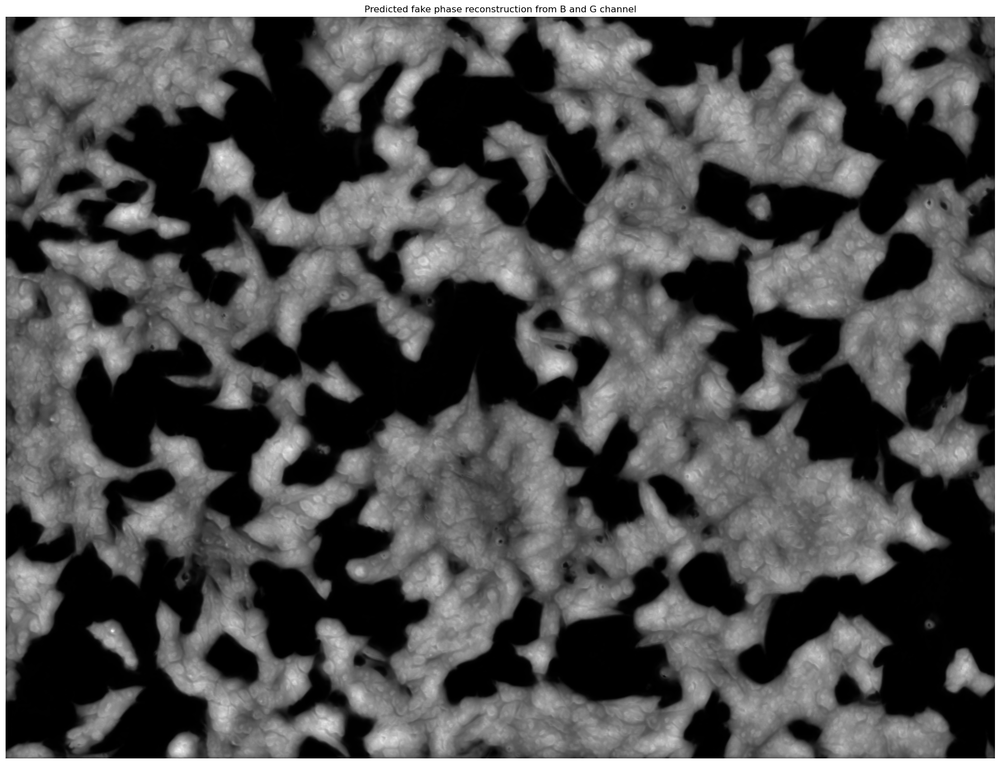

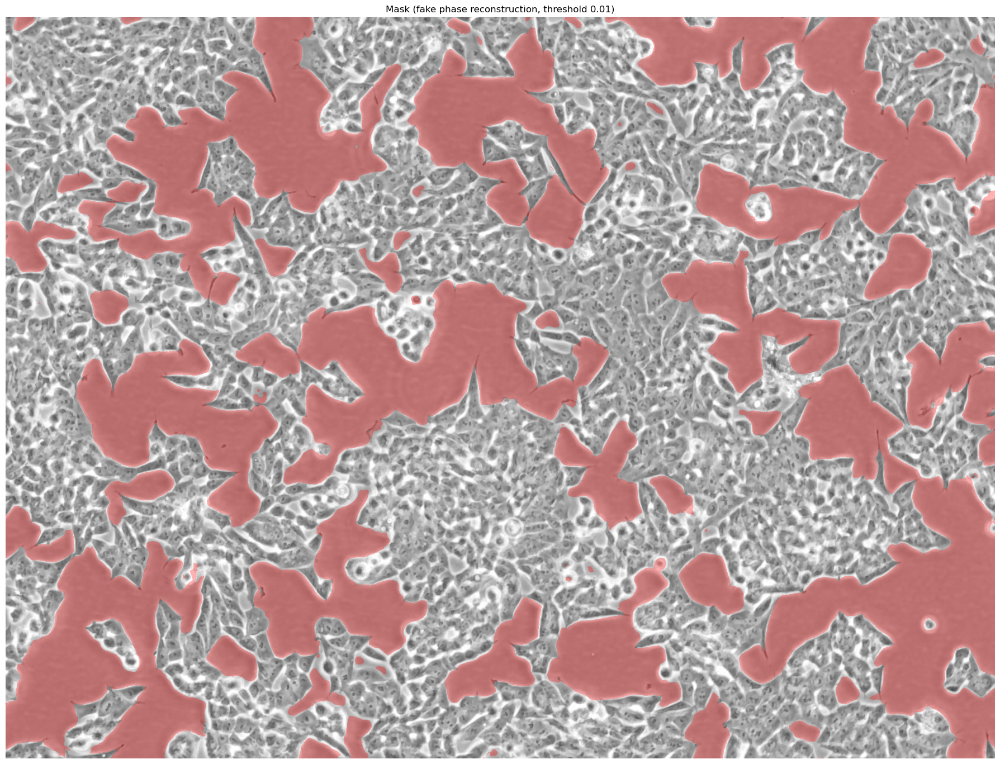

In [3]:

import onnxruntime as ort
import numpy as np


def get_sess(model_path: str):
  providers = [
    (
      "CUDAExecutionProvider",
      {
        "device_id": 0,
        "gpu_mem_limit": int(
          8000 * 1024 * 1024
        ),  # parameter demands value in bytes
        "arena_extend_strategy": "kSameAsRequested",
        "cudnn_conv_algo_search": "HEURISTIC",
        "do_copy_in_default_stream": True,
      },
    ),
    "CPUExecutionProvider",
  ]
  sess_opts: ort.SessionOptions = ort.SessionOptions()
  sess_opts.log_severity_level = 2
  sess_opts.log_verbosity_level = 2
  sess = ort.InferenceSession(model_path, providers=providers, sess_options=sess_opts)
  return sess


model_path = "../data/phaseimaging-combo-v3.onnx"

input = np.expand_dims(np.transpose(img[..., [2, 1]], (2, 0, 1)), axis=0)

sess = get_sess(model_path=model_path)
output_names = [out.name for out in sess.get_outputs()]
input_name = sess.get_inputs()[0].name

pred = sess.run(output_names, {input_name: input})[0]

thresh = 0.01
mask = (pred[0, 0] > thresh).reshape(img.shape[:2])

plot_image(
  pred[0, 0], title=f"Predicted fake phase reconstruction from B and G channel"
)
plot_image(
  skimage.color.label2rgb(1 - mask, img, bg_color=None, alpha=0.3),
  title=f"Mask (fake phase reconstruction, threshold {thresh:.2f})",
)

In [4]:

def points_within(pts, x,y, X,Y):
  return pts[np.logical_and.reduce([
    pts[:,0] >= x,
    pts[:,0] < X,
    pts[:,1] >= y,
    pts[:,1] < Y,
  ])]

grid = 4

def tile(x, pts=None):
  nx, ny = grid, grid
  dx, dy = x.shape[0] // nx, x.shape[1] // ny

  for i in range(0, x.shape[0], dx):
    for j in range(0, x.shape[1], dy):
      out = x[i : i + dx, j : j + dy]

      if pts is not None:
        pts_ = points_within(pts, i, j, i+dx, j+dy)
        pts_[:,0] -= i; pts_[:,1] -= j
        out = (out, pts_)

      yield out


tiles, tiles_points = zip(*list(tile(img, pos)))
tiles_mask = list(tile(mask))


fig, axs = mk_fig(grid, grid, shape=img.shape[:2])

for i, (ax, tile, pts, msk) in enumerate(zip(axs.flat, tiles, tiles_points, tiles_mask)):
  ax.autoscale(False)
  out = tile[...,1]*(msk*0.3 + 0.7)

  plot_image(out, ax)
  
  ax.scatter(pts[:,1], pts[:,0], marker='o', color='r', s=500)
  #ax.set_title(f"Tile {i+1}")
  # set the limits to only show the image region
  ax.set_xlim(0, tile.shape[1])
  ax.set_ylim(tile.shape[0], 0)

Avarage accuracy in 16 dense tiles: 0.89 ± 0.04 (mean relative error)


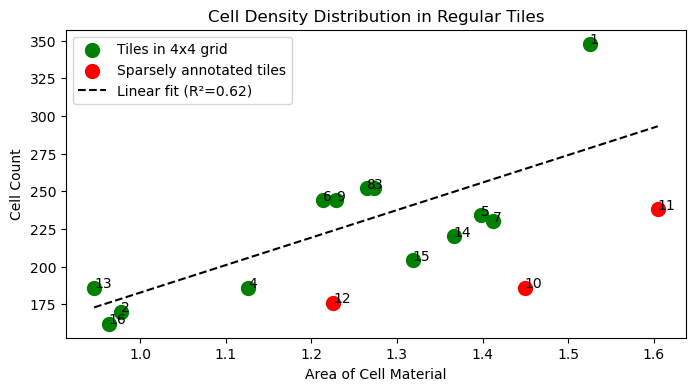

In [5]:

dense_tiles = [0,1,2,3,4,5,6,7,8 ,12,13,14,15]  # note 9 and 10 are sparesely annotated


areas, counts, denss = zip(*[
  ( A := tiles_mask[t].sum() / 1e5
  , N := tiles_points[t].size
  , N / A)
  for t in range(len(tiles))
])


fig, ax = plt.subplots(1,1, figsize=(8,4))
# add the tile number as text to each scatter point
for i, (x, y) in enumerate(zip(areas, counts)):
  ax.scatter(x, y, marker='o', color='g' if i in dense_tiles else 'r', s=100, label=f"Tiles in {grid}x{grid} grid" if i == 0 else 'Sparsely annotated tiles' if i == 9 else None)
  ax.text(x, y, str(i+1), fontsize=10)

dens = sum([denss[i] for i in dense_tiles]) / len(dense_tiles)

r2 = 1 - sum([(counts[i] - dens*areas[i])**2 for i in dense_tiles]) / sum([(counts[i] - np.mean(counts))**2 for i in dense_tiles])

# plot the density as a linear function of the area
x = np.linspace(min(areas), max(areas), 100)
ax.plot(x, dens*x, color='k', linestyle='--', label=f"Linear fit (R²={r2:.2f})")

ax.set_xlabel("Area of Cell Material")
ax.set_ylabel("Cell Count")

ax.legend()
ax.set_title(f"Cell Density Distribution in Regular Tiles");



# calculate the prediction accuracy in mean relative error and standard deviation
acc = 1-np.mean([abs(counts[i] - dens*areas[i]) / counts[i] for i in dense_tiles])

print(f"Avarage accuracy in {len(tiles)} dense tiles: {acc:.2f} ± {np.std([abs(counts[i] - dens*areas[i]) / counts[i] for i in dense_tiles]):.2f} (mean relative error)")

In [6]:

# now aggregate areas, counts and denss for every third tile

areas_train, counts_train, denss_train = zip(*[
  ( areas[t]
  , counts[t]
  , denss[t])
  for t in [0,2,3,4,6,7,8,12,13,14]
])

areas_test, counts_test, denss_test = zip(*[
  ( areas[t]
  , counts[t]
  , denss[t])
  for t in [1,5,15]
])

# calculate the relative error for the test set give the linear fit from the training set
dens_train = sum(denss_train) / len(denss_train)

area_test = sum(areas_test)
count_test = sum(counts_test)

acc = 1 - abs(count_test - dens_train*area_test) / count_test
print(f"Accuracy of density from {int(len(areas_train)/grid/grid*100)}/{int(len(areas_test)/grid/grid*100)} % densly annotated regions split: {acc:.2f}")

Accuracy of density from 62/18 % densly annotated regions split: 1.00


In [7]:


# randomly pick three tiles from dense_tiles

import random

dense_tiles = list(dense_tiles)


accs = []

for i in range(10000):
  random.shuffle(dense_tiles)

  test = dense_tiles[:3]
  train = dense_tiles[3:]

  dens_train = sum([denss[i] for i in train]) / len(train)
  dens_test = sum([denss[i] for i in test]) / len(test)

  accs.append(1 - abs(dens_test - dens_train) / dens_test)

print(f"Accuracy is {np.mean(accs):.2f} ± {np.std(accs):.2f} (mean relative error) for {len(accs)} random splits of the dense tiles")

Accuracy is 0.93 ± 0.04 (mean relative error) for 10000 random splits of the dense tiles
